In [1]:
%matplotlib inline
#from events import merge_trial_and_audio_onsets, generate_beat_events, simple_beat_event_id_generator, extract_events_from_raw
import mne
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt

In [2]:
fname = ".../mne/P01-raw.fif"
raw = mne.io.read_raw_fif(fname, preload=True)
eeg_picks = mne.pick_types(raw.info, meg=False, eeg=True, eog=False, stim=False, exclude=[])
print(raw.info)

Opening raw data file .../mne/P01-raw.fif...
Isotrak not found
    Range : 0 ... 2478165 =      0.000 ...  4840.166 secs
Ready.
Reading 0 ... 2478165  =      0.000 ...  4840.166 secs...
<Info | 11 non-empty values
 bads: 3 items (P8, P10, T8)
 ch_names: Fp1, AF7, AF3, F1, F3, F5, F7, FT7, FC5, FC3, FC1, C1, C3, C5, ...
 chs: 64 EEG, 4 EOG, 1 STIM
 custom_ref_applied: True
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 104.0 Hz
 meas_date: 2015-01-28 17:39:57 UTC
 meas_id: 4 items (dict)
 nchan: 69
 projs: []
 sfreq: 512.0 Hz
>


Plot our data to see what we are working with

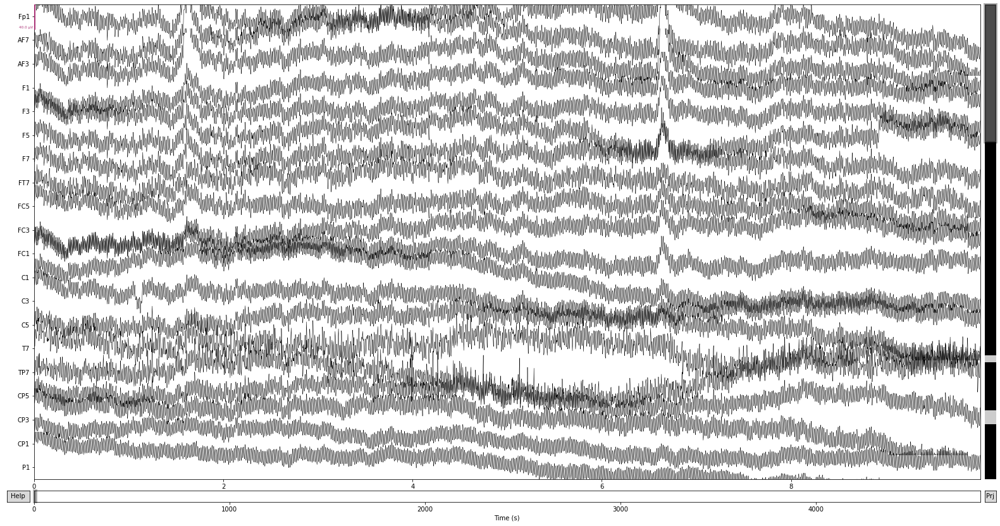

In [4]:
%matplotlib inline
raw.plot()

Lets try to visualize the events.

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
<ipython-input-3-03d953a46961>:7: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(trial_events, raw.info['sfreq'], raw.first_samp, axes=axes)


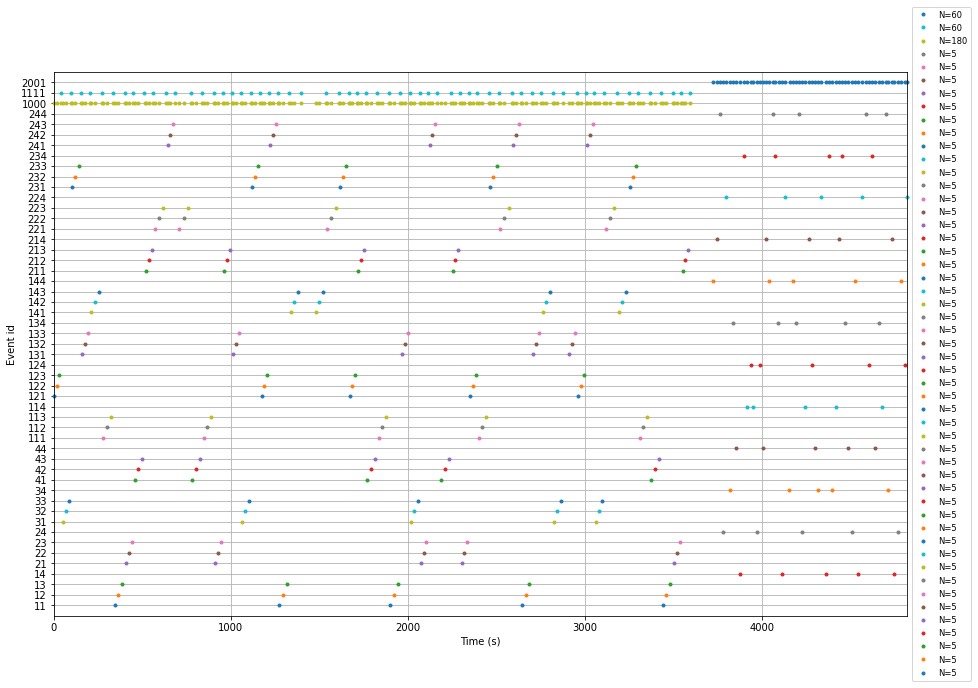

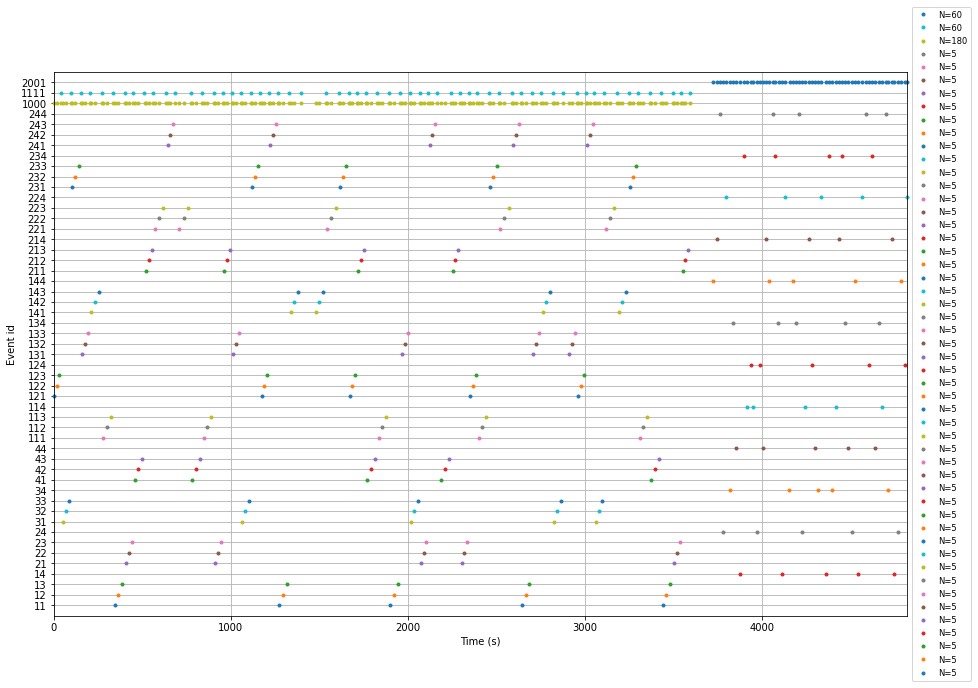

In [3]:
%matplotlib inline
trial_events = mne.find_events(raw, stim_channel='STI 014', shortest_event=0)
trial_events_times = raw.times[trial_events[:,0]]

plt.figure(figsize=(17,10))
axes = plt.gca()
mne.viz.plot_events(trial_events, raw.info['sfreq'], raw.first_samp, axes=axes)

#print('1st event at ', raw.times[trial_events[0,0]])
#print('last event at ', raw.times[trial_events[-1,0]])

<h1> Merge the audio onsets and the events <h1/>

In [4]:
use_audio_onsets=True
inplace=True
stim_channel = "STI 014"

orig_trial_events = trial_events
events = mne.find_events(raw, stim_channel, shortest_event=0)

merged = list()
last_trial_events = None
for i, event in enumerate(events):
    etype = event[2]
    #print("etype is: " + str(etype))
    if etype < 1000 or etype == 1111: # trial or noise onset
        if use_audio_onsets and events[i+1][2] == 1000: # followed by audio onset
            onset = events[i+1][0]
            merged.append([onset, 0, etype])
        else:
            # either we are not interested in audio onsets or there is none
            merged.append(event)
    # audio onsets (etype == 1000) are not copied
    if etype > 1111: # other events (keystrokes)
        merged.append(event)

merged = np.asarray(merged, dtype=int)
#print("Merged: " + str(merged))

if inplace:
    stim_id = raw.ch_names.index(stim_channel)
    #raw[stim_id,:]
    
    #data[stim_id,:].fill(0)     # delete data in stim channel
    raw.add_events(merged, stim_channel=stim_channel, replace=True)

#return merged

# recompute trial_events and times
trial_events = mne.find_events(raw, stim_channel='STI 014', shortest_event=0)
trial_events_times = raw.times[trial_events[:,0]]

print("done")

540 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1000 1111 2001]
360 events found
Event IDs: [  11   12   13   14   21   22   23   24   31   32   33   34   41   42
   43   44  111  112  113  114  121  122  123  124  131  132  133  134
  141  142  143  144  211  212  213  214  221  222  223  224  231  232
  233  234  241  242  243  244 1111 2001]
done


<h2>Check if everything merged properly

<ipython-input-5-4558c1d9d6e5>:5: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  mne.viz.plot_events(merged, raw.info['sfreq'], raw.first_samp, axes=axes)


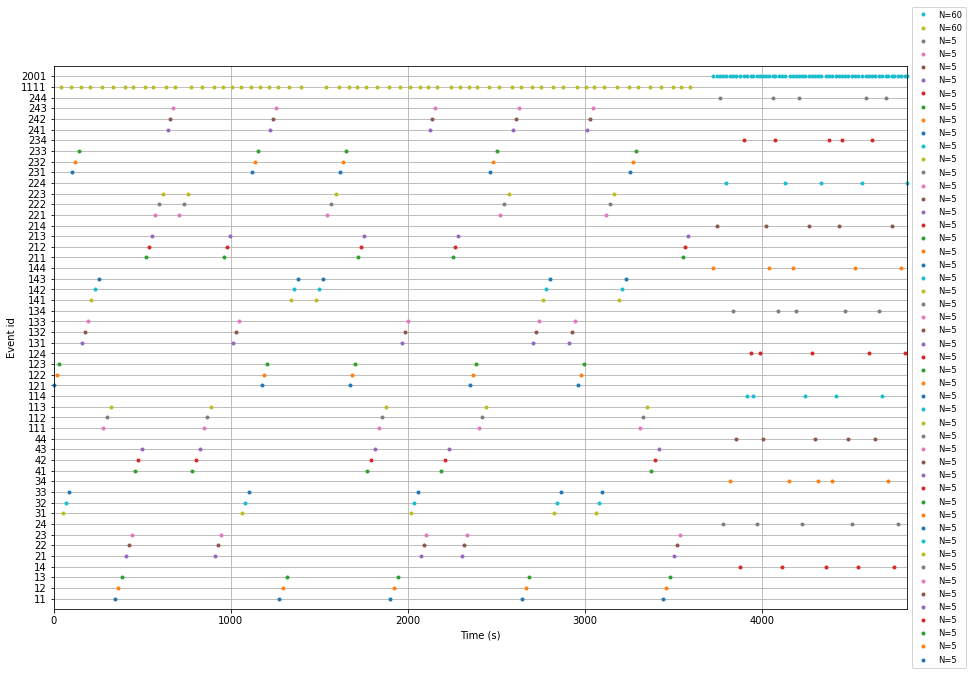

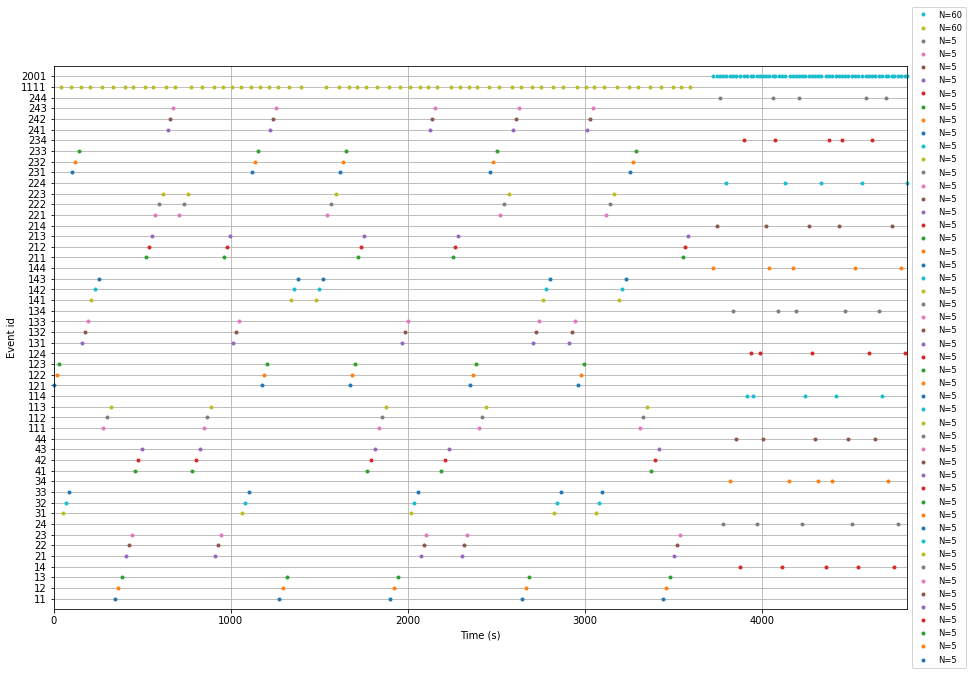

In [5]:
use_audio_onsets=True 

plt.figure(figsize=(17,10))
axes = plt.gca()
mne.viz.plot_events(merged, raw.info['sfreq'], raw.first_samp, axes=axes)

Effective window size : 4.000 (s)


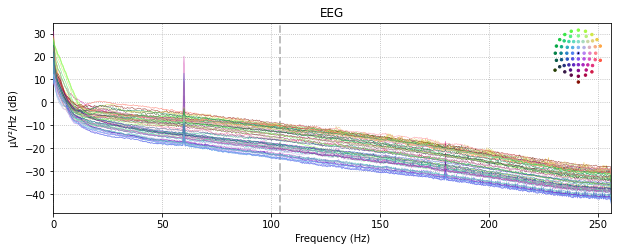

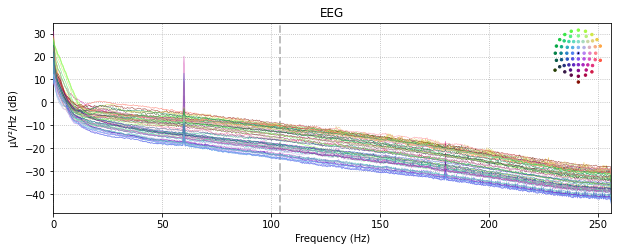

In [6]:
raw.plot_psd()
# seems there's a lot of line noise at 60hz & 180hz

(2478166,)


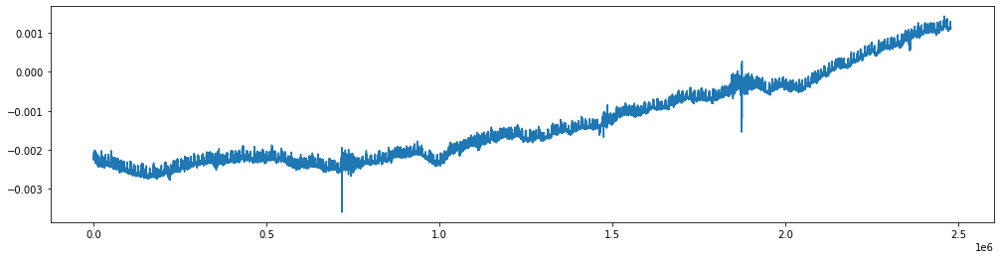

In [9]:
def check_channel(ch_num):

    channel = raw[ch_num,:][0].squeeze()
    print(channel.shape)
    plt.figure(figsize=(17,4))
    plt.plot(channel)

check_channel(0)


<h2> Bandpass Filtering

In [10]:
raw.filter(0.5, 30)
print('done')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3381 samples (6.604 sec)

done


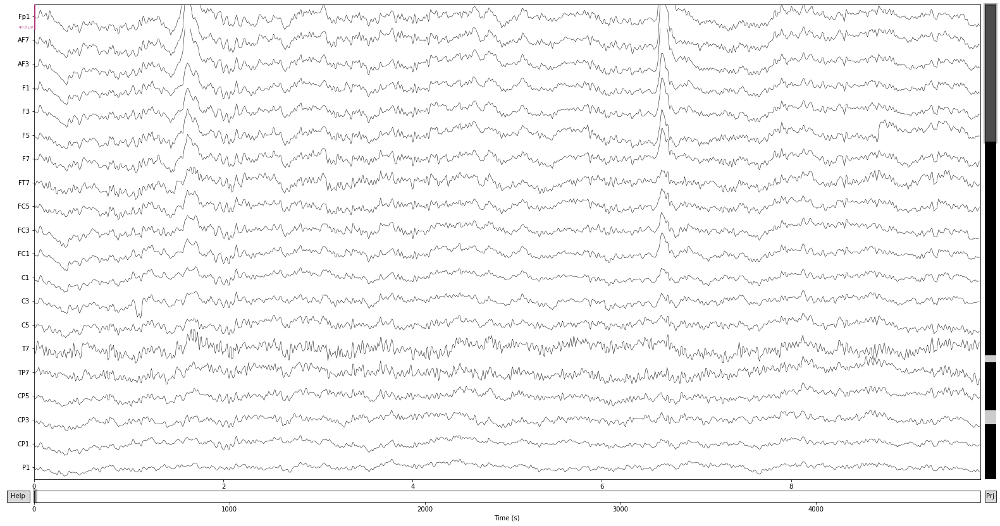

In [11]:
%matplotlib tk
raw.plot()

Channels marked as bad: ['P8', 'P10', 'T8']
(2478166,)


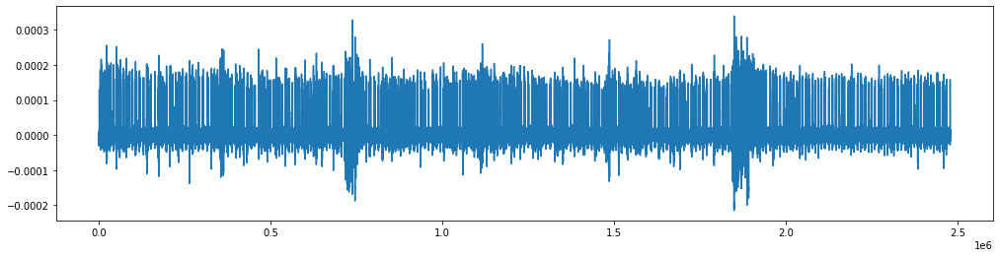

In [12]:
%matplotlib inline

check_channel(0)

Effective window size : 4.000 (s)


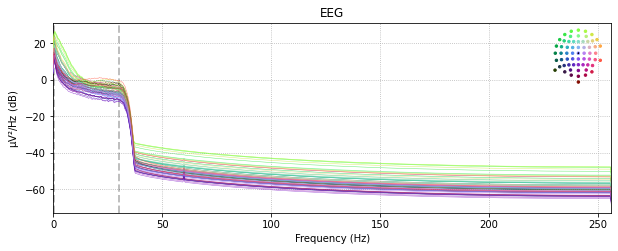

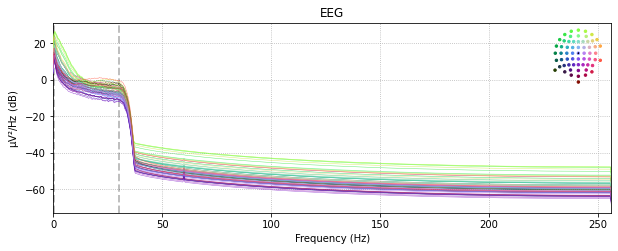

In [13]:
raw.plot_psd()

In [14]:
 def generate_beat_events():
        ## generate beat events and epochs before downsampling
        # read trial events

        # generate simple beat events with same ID (10000)
        beat_events = generate_beat_events(trial_events,
                                           version=self.stimuli_version,
                                           beat_event_id_generator=10000,
                                           verbose=verbose)

        # FIXME: read from settings
        picks = mne.pick_types(raw.info, meg=False, eeg=True, eog=True, stim=True, exclude=[])
        event_id = None # any
        tmin = -0.2  # start of each epoch (200ms before the trigger)
        tmax = 0.8  # end of each epoch (600ms after the trigger) - longest beat is 0.57s long
        detrend = 0 # remove dc
        # reject = dict(eog=250e-6) # TODO: optionally reject epochs
        beat_epochs = mne.Epochs(raw, beat_events, event_id,
                                      tmin, tmax, preload=True,
                                      proj=False, picks=picks, verbose=False)
        print(beat_epochs)

        self.beat_epochs = beat_epochs
    
def generate_beat_events(trial_events,                  # base events as stored in raw fif files
                         include_cue_beats=True,        # generate events for cue beats as well?
                         use_audio_onset=True,          # use the more precise audio onset marker (code 1000) if present
                         exclude_stimulus_ids=[],
                         exclude_condition_ids=[],
                         beat_event_id_generator= 10000,
                         sr=512.0,                      # sample rate, correct value important to compute event frames
                         verbose=False,
                         version=None):

    ## prepare return value
    beat_events = []

    ## get stimuli meta information
    meta = load_stimuli_metadata_map(version=version)
    beats = load_stimuli_metadata_map('beats', verbose=verbose, version=version)

    if include_cue_beats:
        cue_beats = load_stimuli_metadata_map('cue_beats')

        ## determine the number of cue beats
        num_cue_beats = dict()
        for stimulus_id in STIMULUS_IDS:
            num_cue_beats[stimulus_id] = \
                meta[stimulus_id]['beats_per_bar'] * meta[stimulus_id]['cue_bars']
        if verbose:
            print(num_cue_beats)

def load_stimuli_metadata_map(key=None, data_root=None, verbose=None, version=None):

    if version is None:
        version = DEFAULT_VERSION

    # handle special case for beats
    if key == 'cue_beats':
        key = 'beats'
        cue = True
    else:
        cue = False

    if key == 'beats':
        map = dict()
        for stimulus_id in STIMULUS_IDS:
            map[stimulus_id] = load_beat_times(stimulus_id,
                                               cue=cue,
                                               data_root=data_root,
                                               verbose=None,
                                               version=version)
        return map

    meta = load_stimuli_metadata(data_root, version=version)

    if key is None:
        return meta  # return everything

    map = dict()
    for stimulus_id in STIMULUS_IDS:
        map[stimulus_id] = meta[stimulus_id][key]

    return(map)


SyntaxError: Missing parentheses in call to 'print'. Did you mean print(num_cue_beats)? (<ipython-input-14-abb984b3ff2f>, line 27)